# Lecture : Graph-based Visualization

## Lab 06 : Uniform Manifold Approximation and Projection (UMAP)

### Xavier Bresson  


In [1]:
# For Google Colaboratory
import sys, os
if 'google.colab' in sys.modules:
    # mount google drive
    from google.colab import drive
    drive.mount('/content/gdrive')
    path_to_file = '/content/gdrive/My Drive/GML2023_codes/codes/06_Visualization'
    print(path_to_file)
    # change current path to the folder containing "path_to_file"
    os.chdir(path_to_file)
    !pwd
    

In [1]:
# Load libraries
import numpy as np
import scipy.io
from matplotlib import pyplot
import matplotlib.pyplot as plt
import time
import sys; sys.path.insert(0, 'lib/')
import scipy.sparse.linalg
# import scipy.ndimage
from lib.utils import construct_knn_graph, nldr_visualization
import warnings; warnings.filterwarnings("ignore")
from sklearn.manifold import TSNE
import umap
import torch, torchvision
import torchvision.transforms as transforms
import numpy as np


# UMAP for MNIST

In [3]:
# MNIST dataset
mat = scipy.io.loadmat('datasets/MNIST_data.mat')
X = Xnumpy = mat['X']
n = X.shape[0]
d = X.shape[1]
C = mat['C'].squeeze()
print(n,d)


60000 784


(60000, 784)
UMAP(n_components=3, verbose=True)


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


Sun Aug 18 15:05:56 2024 Construct fuzzy simplicial set
Sun Aug 18 15:05:56 2024 Finding Nearest Neighbors
Sun Aug 18 15:05:56 2024 Building RP forest with 17 trees
Sun Aug 18 15:05:59 2024 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting after 4 iterations
Sun Aug 18 15:06:04 2024 Finished Nearest Neighbor Search
Sun Aug 18 15:06:05 2024 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Sun Aug 18 15:06:14 2024 Finished embedding
time(sec): 18.235038995742798
(60000, 3)


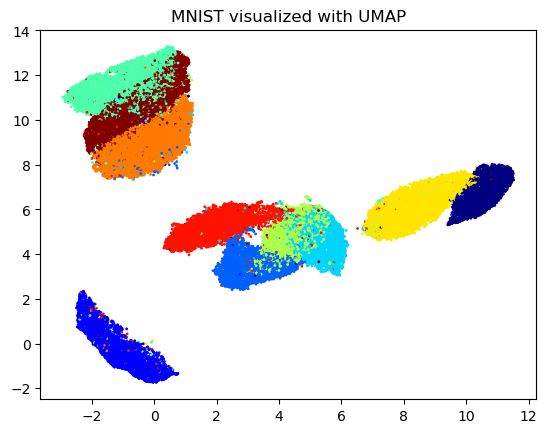

In [4]:
# UMAP : https://umap-learn.readthedocs.io
start = time.time()
# reducer = umap.UMAP(n_components=3, n_neighbors=20, random_state=42, transform_seed=42, verbose=False) # UMAP
reducer = umap.UMAP(n_components=3, verbose=True)
print(X.shape)
embedding = reducer.fit_transform(X)
print('time(sec):',(time.time()-start)/1)

print(embedding.shape)
Xvis = embedding[:,0]
Yvis = embedding[:,1]
Zvis = embedding[:,2]

# 2D Visualization
plt.figure(3)
plt.scatter(Xvis, Yvis, c=C, s=1, color=pyplot.jet())
plt.title('MNIST visualized with UMAP') 
plt.show()


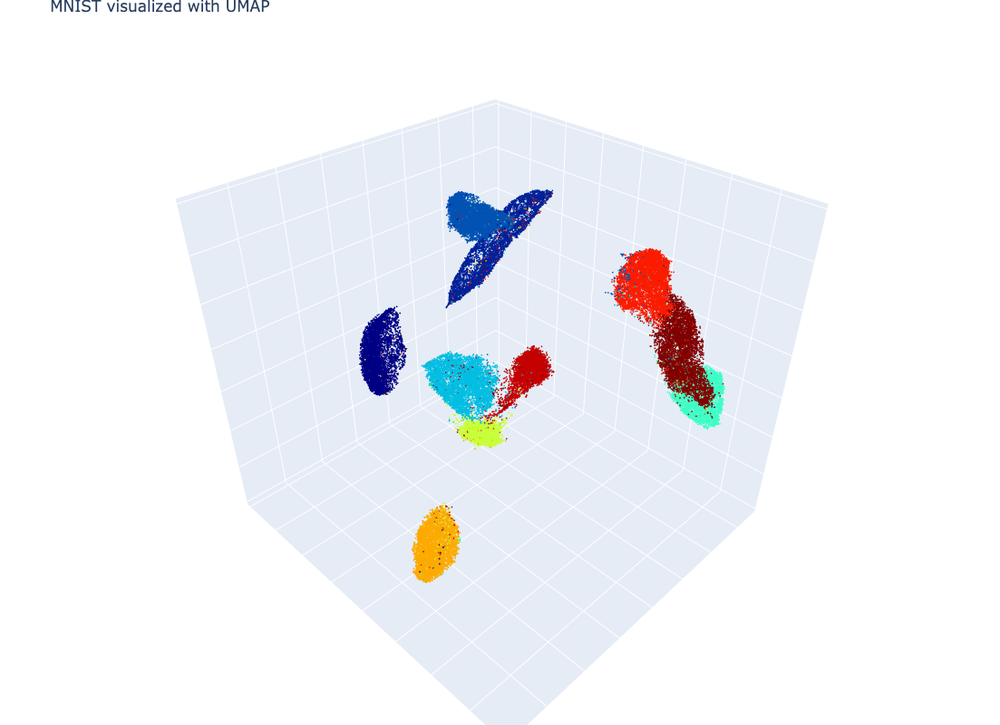

In [7]:
# 3D Visualization
import plotly.graph_objects as go
data = go.Scatter3d(x=Xvis, y=Yvis, z=Zvis, mode='markers', marker=dict(size=1, color=C, colorscale='jet', opacity=1)) # data as points
# data = go.Scatter3d(x=Xvis, y=Yvis, z=Zvis, mode='markers', marker=dict(size=1, color=C, colorscale='jet', opacity=1, showscale=True)) # w/ colobar 
fig = go.Figure(data=[data]) 
fig.update_layout(margin=dict(l=0, r=0, b=0, t=25, pad=0)) # tight layout but t=25 required for showing title 
fig.update_layout(autosize=False, width=800, height=800, title_text="MNIST visualized with UMAP") # figure size and title
# fig.update_layout(scene = dict(xaxis = dict(visible=False), yaxis = dict(visible=False), zaxis = dict(visible=False))) # no grid, no axis 
# fig.update_layout(scene = dict(xaxis_title = ' ', yaxis_title = ' ', zaxis_title = ' ')) # no axis name 
fig.update_layout(scene = dict(zaxis = dict(showgrid = True, showticklabels = False), zaxis_title = ' ') ) # no range values, no axis name, grid on
fig.update_layout(scene = dict(yaxis = dict(showgrid = True, showticklabels = False), yaxis_title = ' ') ) # no range values, no axis name, grid on
fig.update_layout(scene = dict(xaxis = dict(showgrid = True, showticklabels = False), xaxis_title = ' ') ) # no range values, no axis name, grid on
fig.show()


# UMAP for CIFAR

In [8]:
# Load CIFAR
trainset = torchvision.datasets.CIFAR10(root='./datasets', train=True, download=True, transform=transforms.ToTensor())
print(len(trainset))
print('data, label:',trainset[0][0].size(),trainset[0][1])


Files already downloaded and verified
50000
data, label: torch.Size([3, 32, 32]) 6


torch.Size([3, 32, 32])
min= tensor(0.0784)   max= tensor(1.)


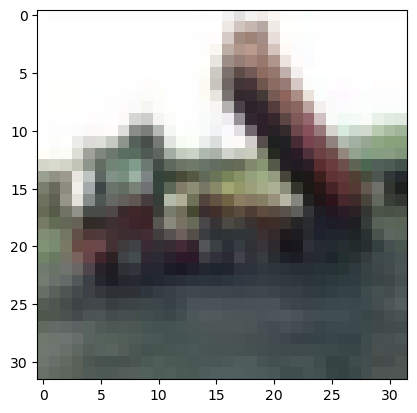

9
X, C : torch.Size([50000, 3, 32, 32]) torch.Size([50000])


In [9]:
# print one CIFAR image
idx = 2
pic, label = trainset[idx]
print(pic.size())
print('min=',torch.min(pic), '  max=',torch.max(pic) )
plt.imshow( np.transpose(  pic.numpy() , (1, 2, 0))  )
plt.show()
print(label)

# prepare CIFAR dataset
prepare_cifar = True
prepare_cifar = False
if prepare_cifar:
    train_data = torch.Tensor(50000,3,32,32)
    train_label = torch.LongTensor(50000)
    for idx, data in enumerate(trainset):
        train_data[idx] = data[0]
        train_label[idx] = data[1]
    torch.save([train_data,train_label],'datasets/cifar.pt')
X, C = torch.load('datasets/cifar.pt')
print('X, C :',X.size(), C.size())
X = X.view(50000,-1).numpy()
C = C.numpy()


(50000, 3072)
UMAP(n_components=3, verbose=True)
Sun Aug 18 15:09:01 2024 Construct fuzzy simplicial set
Sun Aug 18 15:09:02 2024 Finding Nearest Neighbors
Sun Aug 18 15:09:02 2024 Building RP forest with 16 trees
Sun Aug 18 15:09:05 2024 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	 5  /  16
	Stopping threshold met -- exiting after 5 iterations
Sun Aug 18 15:09:12 2024 Finished Nearest Neighbor Search
Sun Aug 18 15:09:12 2024 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Sun Aug 18 15:09:20 2024 Finished embedding
time(sec): 19.836856603622437
(50000, 3)


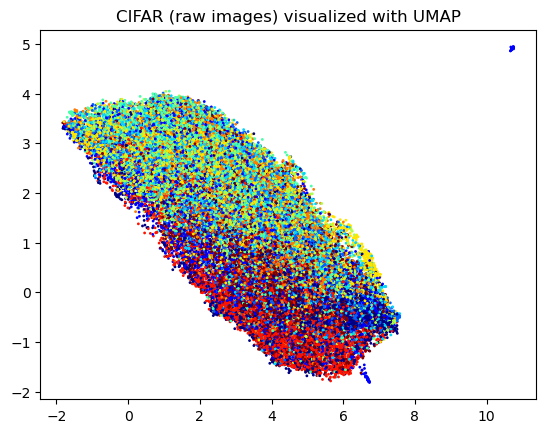

In [10]:
# UMAP : https://umap-learn.readthedocs.io
start = time.time()
# reducer = umap.UMAP(n_components=3, n_neighbors=20, random_state=42, transform_seed=42, verbose=False) # UMAP
reducer = umap.UMAP(n_components=3, verbose=True)
print(X.shape)
embedding = reducer.fit_transform(X)
print('time(sec):',(time.time()-start)/1)

print(embedding.shape)
Xvis = embedding[:,0]
Yvis = embedding[:,1]
Zvis = embedding[:,2]

# 2D Visualization
plt.figure(3)
plt.scatter(Xvis, Yvis, c=C, s=1, color=pyplot.jet())
plt.title('CIFAR (raw images) visualized with UMAP') 
plt.show()


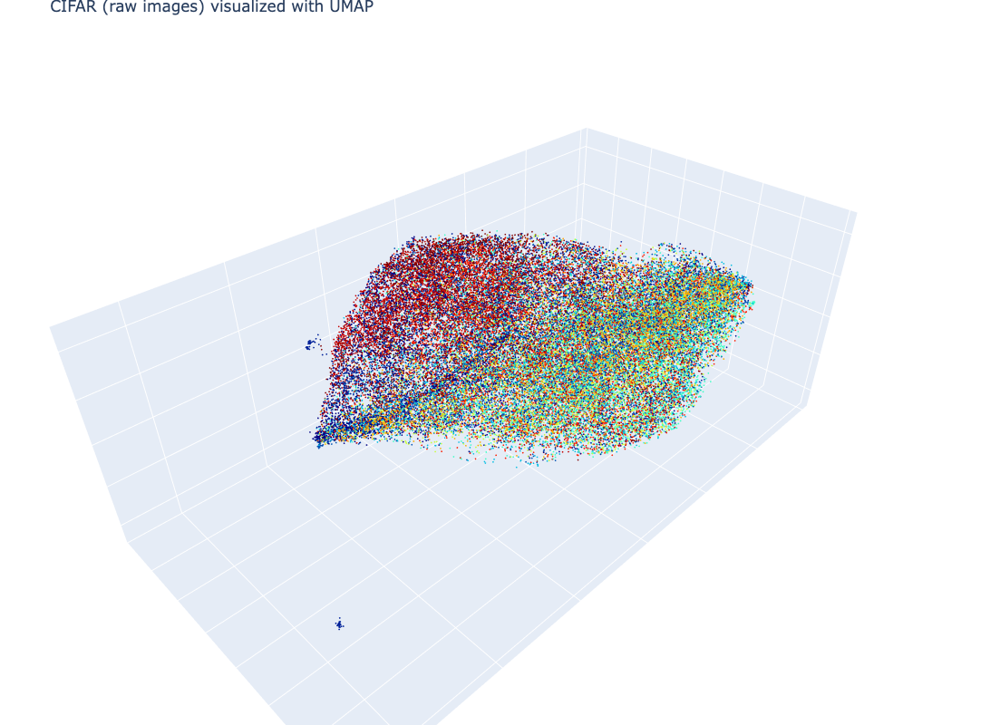

In [11]:
# 3D Visualization
import plotly.graph_objects as go
data = go.Scatter3d(x=Xvis, y=Yvis, z=Zvis, mode='markers', marker=dict(size=1, color=C, colorscale='jet', opacity=1)) # data as points
# data = go.Scatter3d(x=Xvis, y=Yvis, z=Zvis, mode='markers', marker=dict(size=1, color=C, colorscale='jet', opacity=1, showscale=True)) # w/ colobar 
fig = go.Figure(data=[data]) 
fig.update_layout(margin=dict(l=0, r=0, b=0, t=25, pad=0)) # tight layout but t=25 required for showing title 
fig.update_layout(autosize=False, width=800, height=800, title_text="CIFAR (raw images) visualized with UMAP") # figure size and title
# fig.update_layout(scene = dict(xaxis = dict(visible=False), yaxis = dict(visible=False), zaxis = dict(visible=False))) # no grid, no axis 
# fig.update_layout(scene = dict(xaxis_title = ' ', yaxis_title = ' ', zaxis_title = ' ')) # no axis name 
fig.update_layout(scene = dict(zaxis = dict(showgrid = True, showticklabels = False), zaxis_title = ' ') ) # no range values, no axis name, grid on
fig.update_layout(scene = dict(yaxis = dict(showgrid = True, showticklabels = False), yaxis_title = ' ') ) # no range values, no axis name, grid on
fig.update_layout(scene = dict(xaxis = dict(showgrid = True, showticklabels = False), xaxis_title = ' ') ) # no range values, no axis name, grid on
fig.show()
